LSTM Model

In [5]:
import os
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# === Paths ===
x_train_folder = r"C:\PatternR\csv_output\tra_X_tr"   # Folder with training X CSVs
y_train_file   = r"C:\PatternR\csv_output\tra_Y_tr.csv"  # Training Y CSV

x_test_folder  = r"C:\PatternR\csv_output\tra_X_te"    # Folder with test X CSVs
y_test_file    = r"C:\PatternR\csv_output\tra_Y_te.csv"  # Test Y CSV

# === Load Y_train ===
Y_tr = pd.read_csv(y_train_file, header=None).values  # shape (36, num_train_samples)
num_train_samples = Y_tr.shape[1]

# === Load X_train ===
X_train_list = []
Y_train_list = []

for i in range(num_train_samples):
    fname = os.path.join(x_train_folder, f"tra_X_tr_{i+1}.csv")
    Xi = pd.read_csv(fname, header=None).values  # shape (36, 48)
    X_train_list.append(Xi)
    Y_train_list.append(Y_tr[:, i])

X_train = np.array(X_train_list)        # (num_train_samples, 36, 48)
Y_train = np.array(Y_train_list)        # (num_train_samples, 36)

print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)

# === Load Y_test ===
Y_te = pd.read_csv(y_test_file, header=None).values  # shape (36, num_test_samples)
num_test_samples = Y_te.shape[1]

# === Load X_test ===
X_test_list = []
Y_test_list = []

for i in range(num_test_samples):
    fname = os.path.join(x_test_folder, f"tra_X_te_{i+1}.csv")
    Xi = pd.read_csv(fname, header=None).values  # shape (36, 48)
    X_test_list.append(Xi)
    Y_test_list.append(Y_te[:, i])

X_test = np.array(X_test_list)          # (num_test_samples, 36, 48)
Y_test = np.array(Y_test_list)          # (num_test_samples, 36)

print("X_test shape:", X_test.shape)
print("Y_test shape:", Y_test.shape)

# === Build LSTM Model ===
model = Sequential()
model.add(LSTM(100, input_shape=(36, 48)))   # sequence length = 36, features = 48
model.add(Dense(36))  # output dimension = 36
model.compile(optimizer='adam', loss='mse')

# === Train ===
history = model.fit(X_train, Y_train, epochs=50, batch_size=64, validation_split=0.1)

# === Evaluate on test data ===
test_loss = model.evaluate(X_test, Y_test)
print(f"Test Loss (MSE): {test_loss}")

# === Save model ===
model.save("lstm_model.h5")


X_train shape: (1261, 36, 48)
Y_train shape: (1261, 36)
X_test shape: (840, 36, 48)
Y_test shape: (840, 36)


c:\Users\kavit\tf_env\new_tf_env\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.0618 - val_loss: 0.0338
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0205 - val_loss: 0.0171
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0113 - val_loss: 0.0095
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0066 - val_loss: 0.0052
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0046 - val_loss: 0.0036
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0037 - val_loss: 0.0028
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0032 - val_loss: 0.0023
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0028 - val_loss: 0.0022
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0024 - val_loss: 0.0018
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0

Test Loss (MSE): 0.0027864312287420034


GRU Model


In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense

model_gru = Sequential()
model_gru.add(GRU(128, input_shape=(36, 48)))   # GRU instead of LSTM
model_gru.add(Dense(36))

model_gru.compile(optimizer='adam', loss='mse')
model_gru.summary()

model_gru.fit(X_train, Y_train, epochs=50, batch_size=64, validation_split=0.1)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 128)            │        68,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 36)             │         4,644 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,996 (285.14 KB)

 Trainable params: 72,996 (285.14 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.0602 - val_loss: 0.0299
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0175 - val_loss: 0.0141
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0088 - val_loss: 0.0069
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0053 - val_loss: 0.0043
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0038 - val_loss: 0.0030
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0031 - val_loss: 0.0023
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0028 - val_loss: 0.0021
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0027 - val_loss: 0.0020
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0024 - val_loss: 0.0018
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0

CNN Model

In [3]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense

model_cnn = Sequential()
model_cnn.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(36, 48)))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(100, activation='relu'))
model_cnn.add(Dense(36))

model_cnn.compile(optimizer='adam', loss='mse')
model_cnn.summary()

model_cnn.fit(X_train, Y_train, epochs=50, batch_size=64, validation_split=0.1)

c:\Users\kavit\tf_env\new_tf_env\.venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 34, 64)         │         9,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 17, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1088)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 100)            │       108,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 36)             │         3,636 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 121,816 (475.84 KB)

 Trainable params: 121,816 (475.84 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0627 - val_loss: 0.0274
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0148 - val_loss: 0.0110
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0077 - val_loss: 0.0065
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0056 - val_loss: 0.0049
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0045 - val_loss: 0.0037
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0038 - val_loss: 0.0030
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0

Bi-Directional LSTM Model

In [4]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Bidirectional

model_bilstm = Sequential()
model_bilstm.add(Bidirectional(LSTM(128), input_shape=(36, 48)))
model_bilstm.add(Dense(36))

model_bilstm.compile(optimizer='adam', loss='mse')
model_bilstm.summary()

model_bilstm.fit(X_train, Y_train, epochs=50, batch_size=64, validation_split=0.1)

c:\Users\kavit\tf_env\new_tf_env\.venv\Lib\site-packages\keras\src\layers\rnn\bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 256)            │       181,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 36)             │         9,252 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 190,500 (744.14 KB)

 Trainable params: 190,500 (744.14 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0438 - val_loss: 0.0170
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.0096 - val_loss: 0.0058
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.0030 - val_loss: 0.0021
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0024 - val_loss: 0.0018
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0023 - val_loss: 0.0017
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - loss: 0.0023 - val_loss: 0.0018
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0022 - val_loss: 0.0016
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.0022 - val_loss: 0.0016
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.0021 - val_loss: 0.0016
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0

Transformer Encoder Model

X_train shape: (1261, 36, 48)
Y_train shape: (1261, 36)
X_test shape: (840, 36, 48)
Y_test shape: (840, 36)


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 36, 48)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 36, 48)    │     49,968 │ input_layer_1[0]… │
│ (MultiHeadAttentio… │                   │            │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 36, 48)    │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 36, 48)    │          0 │ dropout_1[0][0],  │
│                     │                   │            │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 36, 48)    │         96 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 36, 48)    │     12,464 │ layer_normalizat… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 36, 48)    │          0 │ sequential_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 36, 48)    │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 36, 48)    │     49,968 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 36, 48)    │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 36, 48)    │          0 │ dropout_4[0][0],  │
│                     │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 36, 48)    │     12,464 │ layer_normalizat… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 36, 48)    │          0 │ sequential_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 36, 48)    │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_3[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 48)        │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                 

 Total params: 127,012 (496.14 KB)

 Trainable params: 127,012 (496.14 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2015 - mae: 0.3199 - val_loss: 0.0511 - val_mae: 0.1764
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0384 - mae: 0.1562 - val_loss: 0.0346 - val_mae: 0.1496
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.0292 - mae: 0.1366 - val_loss: 0.0283 - val_mae: 0.1350
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0236 - mae: 0.1219 - val_loss: 0.0212 - val_mae: 0.1143
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.0173 - mae: 0.1025 - val_loss: 0.0129 - val_mae: 0.0878
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.0127 - mae: 0.0872 - val_loss: 0.0090 - val_mae: 0.0732
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0107 - mae: 0.0801 - val_loss: 0.0074 - val_mae: 0.0655
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.0095 - mae: 0.0755 - val_loss: 0.0061 - val_mae: 0.0591
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.0

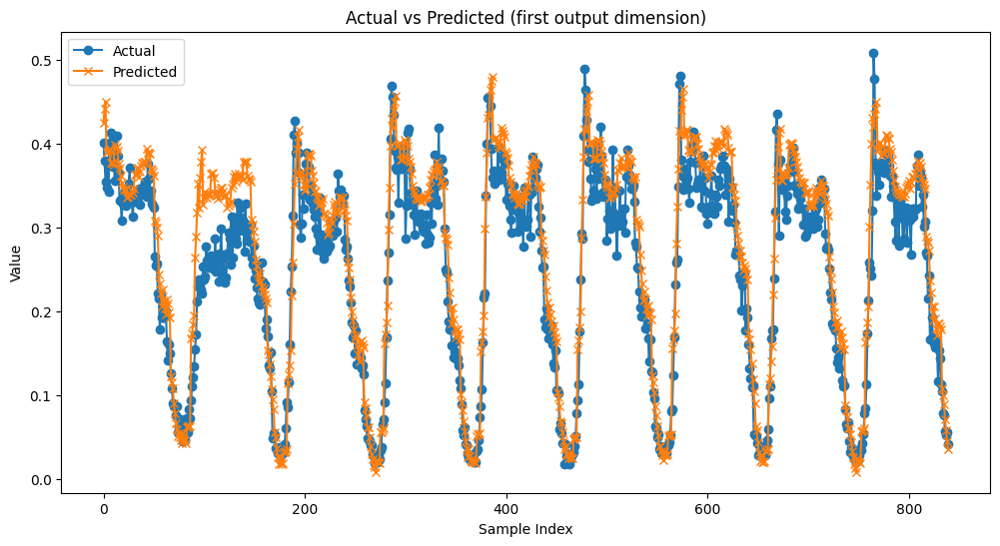

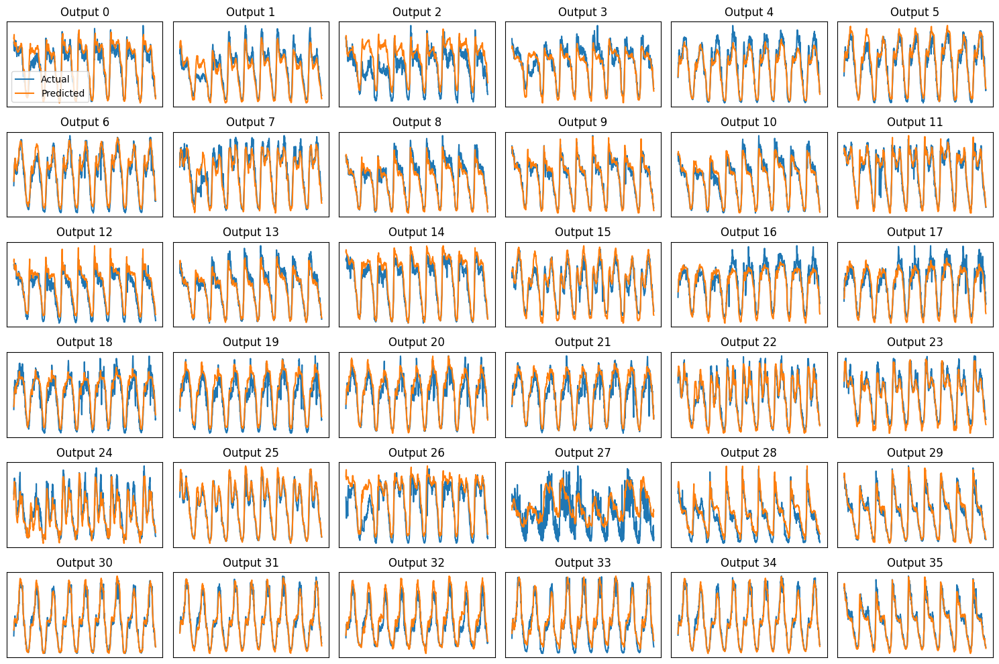

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Model

# === Paths ===
x_train_folder = r"C:\PatternR\csv_output\tra_X_tr"
y_train_file   = r"C:\PatternR\csv_output\tra_Y_tr.csv"
x_test_folder  = r"C:\PatternR\csv_output\tra_X_te"
y_test_file    = r"C:\PatternR\csv_output\tra_Y_te.csv"

# === Load Y_train ===
Y_tr = pd.read_csv(y_train_file, header=None).values  # (36, num_train_samples)
num_train_samples = Y_tr.shape[1]

# === Load X_train ===
X_train_list, Y_train_list = [], []
for i in range(num_train_samples):
    fname = os.path.join(x_train_folder, f"tra_X_tr_{i+1}.csv")
    Xi = pd.read_csv(fname, header=None).values
    X_train_list.append(Xi)
    Y_train_list.append(Y_tr[:, i])
X_train = np.array(X_train_list)
Y_train = np.array(Y_train_list)

# === Load Y_test ===
Y_te = pd.read_csv(y_test_file, header=None).values
num_test_samples = Y_te.shape[1]

# === Load X_test ===
X_test_list, Y_test_list = [], []
for i in range(num_test_samples):
    fname = os.path.join(x_test_folder, f"tra_X_te_{i+1}.csv")
    Xi = pd.read_csv(fname, header=None).values
    X_test_list.append(Xi)
    Y_test_list.append(Y_te[:, i])
X_test = np.array(X_test_list)
Y_test = np.array(Y_test_list)

print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)
print("X_test shape:", X_test.shape)
print("Y_test shape:", Y_test.shape)

# === Transformer Encoder Block ===
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = layers.MultiHeadAttention(key_dim=head_size, num_heads=num_heads)(inputs, inputs)
    x = layers.Dropout(dropout)(x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + inputs)
    
    ffn = tf.keras.Sequential([
        layers.Dense(ff_dim, activation="relu"),
        layers.Dense(inputs.shape[-1]),
    ])
    x2 = ffn(x)
    x2 = layers.Dropout(dropout)(x2)
    return layers.LayerNormalization(epsilon=1e-6)(x + x2)

# === Build Transformer Model ===
inputs = layers.Input(shape=(36, 48))
x = transformer_encoder(inputs, head_size=64, num_heads=4, ff_dim=128, dropout=0.2)
x = transformer_encoder(x, head_size=64, num_heads=4, ff_dim=128, dropout=0.2)
x = layers.GlobalAveragePooling1D()(x)
outputs = layers.Dense(36)(x)
model_transformer = Model(inputs, outputs)
model_transformer.compile(optimizer="adam", loss="mse", metrics=["mae"])
model_transformer.summary()

# === Train ===
history = model_transformer.fit(
    X_train, Y_train,
    epochs=50,
    batch_size=64,
    validation_split=0.1
)

# === Predict on test data ===
y_pred = model_transformer.predict(X_test)

# === Plot first output dimension ===
y_true = Y_test[:, 0]
y_pred_col = y_pred[:, 0]
plt.figure(figsize=(12,6))
plt.plot(y_true, label="Actual", marker='o')
plt.plot(y_pred_col, label="Predicted", marker='x')
plt.title("Actual vs Predicted (first output dimension)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.show()

# === Plot all 36 output dimensions in subplots ===
plt.figure(figsize=(15,10))
for i in range(36):
    plt.subplot(6, 6, i+1)
    plt.plot(Y_test[:, i], label="Actual")
    plt.plot(y_pred[:, i], label="Predicted")
    plt.title(f"Output {i}")
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.legend()
plt.tight_layout()
plt.show()


Transformer Encoder with Adjacency

X_train shape: (1261, 36, 48)
Y_train shape: (1261, 36)
X_test shape: (840, 36, 48)
Y_test shape: (840, 36)


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 36, 48)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 36, 48)    │     49,968 │ input_layer_4[0]… │
│ (MultiHeadAttentio… │                   │            │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 36, 48)    │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 36, 48)    │          0 │ dropout_7[0][0],  │
│                     │                   │            │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_4[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 36, 48)    │     12,464 │ layer_normalizat… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 36, 48)    │          0 │ sequential_3[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_5 (Add)         │ (None, 36, 48)    │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_8[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_5[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 36, 48)    │     49,968 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 36, 48)    │          0 │ multi_head_atten… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_6 (Add)         │ (None, 36, 48)    │          0 │ dropout_10[0][0], │
│                     │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_6[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 36, 48)    │     12,464 │ layer_normalizat… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_11          │ (None, 36, 48)    │          0 │ sequential_4[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, 36, 48)    │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_11[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_7[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 127,012 (496.14 KB)

 Trainable params: 127,012 (496.14 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1942 - mae: 0.3181 - val_loss: 0.0447 - val_mae: 0.1674
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0405 - mae: 0.1591 - val_loss: 0.0261 - val_mae: 0.1243
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0301 - mae: 0.1377 - val_loss: 0.0215 - val_mae: 0.1126
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0251 - mae: 0.1247 - val_loss: 0.0171 - val_mae: 0.1017
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0194 - mae: 0.1085 - val_loss: 0.0124 - val_mae: 0.0856
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0144 - mae: 0.0936 - val_loss: 0.0089 - val_mae: 0.0738
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0111 - mae: 0.0821 - val_loss: 0.0067 - val_mae: 0.0636
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mae: 0.0740 - val_loss: 0.0057 - val_mae: 0.0583
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.008

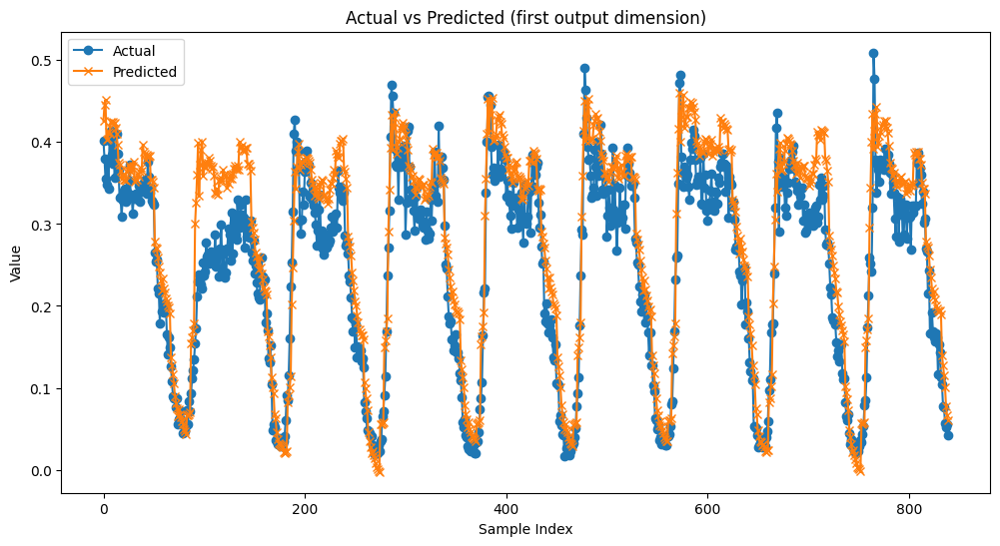

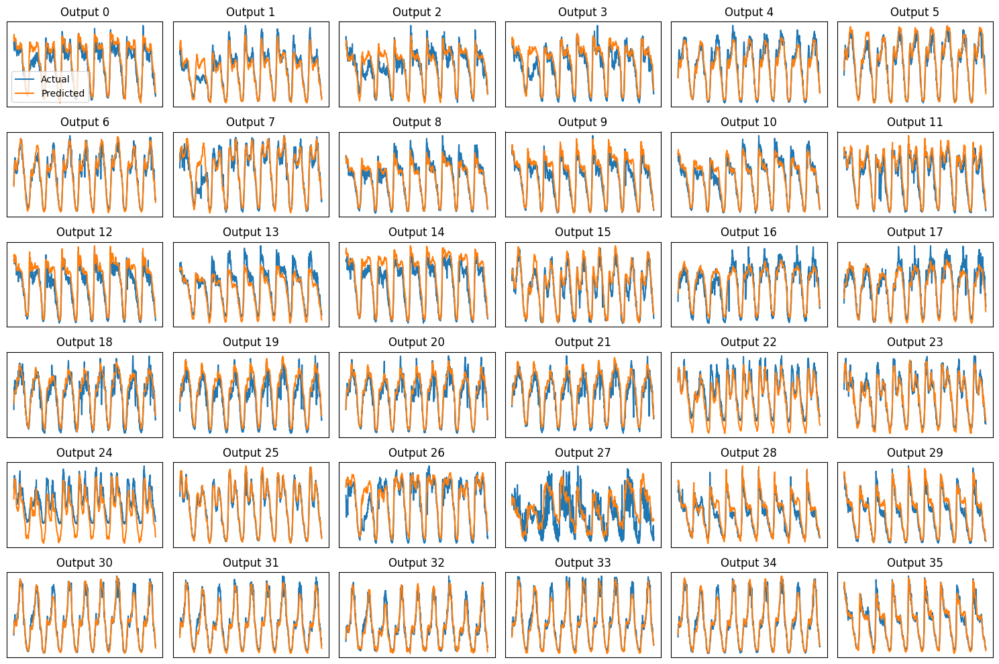

In [3]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, Model
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# === Paths ===
x_train_folder = r"C:\PatternR\csv_output\tra_X_tr"
y_train_file   = r"C:\PatternR\csv_output\tra_Y_tr.csv"
x_test_folder  = r"C:\PatternR\csv_output\tra_X_te"
y_test_file    = r"C:\PatternR\csv_output\tra_Y_te.csv"
adj_file       = r"C:\PatternR\csv_output\tra_adj_mat.csv"

# === Load adjacency matrix ===
A = np.loadtxt(adj_file, delimiter=',')  # shape (36,36)
A = tf.convert_to_tensor(A, dtype=tf.float32)

# === Load Y_train ===
Y_tr = pd.read_csv(y_train_file, header=None).values
num_train_samples = Y_tr.shape[1]

# === Load X_train ===
X_train_list, Y_train_list = [], []
for i in range(num_train_samples):
    fname = os.path.join(x_train_folder, f"tra_X_tr_{i+1}.csv")
    Xi = pd.read_csv(fname, header=None).values
    X_train_list.append(Xi)
    Y_train_list.append(Y_tr[:, i])
X_train = np.array(X_train_list)
Y_train = np.array(Y_train_list)

# === Load Y_test ===
Y_te = pd.read_csv(y_test_file, header=None).values
num_test_samples = Y_te.shape[1]

# === Load X_test ===
X_test_list, Y_test_list = [], []
for i in range(num_test_samples):
    fname = os.path.join(x_test_folder, f"tra_X_te_{i+1}.csv")
    Xi = pd.read_csv(fname, header=None).values
    X_test_list.append(Xi)
    Y_test_list.append(Y_te[:, i])
X_test = np.array(X_test_list)
Y_test = np.array(Y_test_list)

print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)
print("X_test shape:", X_test.shape)
print("Y_test shape:", Y_test.shape)

# === Transformer Encoder Block with adjacency ===
def transformer_encoder_adj(inputs, adj_matrix, head_size, num_heads, ff_dim, dropout=0):
    attention_output = layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads
    )(inputs, inputs, attention_mask=adj_matrix)
    x = layers.Dropout(dropout)(attention_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + inputs)

    ffn = tf.keras.Sequential([
        layers.Dense(ff_dim, activation="relu"),
        layers.Dense(inputs.shape[-1])
    ])
    x2 = ffn(x)
    x2 = layers.Dropout(dropout)(x2)
    return layers.LayerNormalization(epsilon=1e-6)(x + x2)

# === Build Transformer Model ===
inputs = layers.Input(shape=(36, 48))
x = transformer_encoder_adj(inputs, A, head_size=64, num_heads=4, ff_dim=128, dropout=0.2)
x = transformer_encoder_adj(x, A, head_size=64, num_heads=4, ff_dim=128, dropout=0.2)
x = layers.GlobalAveragePooling1D()(x)
outputs = layers.Dense(36)(x)
model_transformer = Model(inputs, outputs)
model_transformer.compile(optimizer="adam", loss="mse", metrics=["mae"])
model_transformer.summary()

# === Train/Test split for validation ===
X_train_final, X_val, Y_train_final, Y_val = train_test_split(
    X_train, Y_train, test_size=0.1, random_state=42
)

# === Train ===
history = model_transformer.fit(
    X_train_final, Y_train_final,
    epochs=50,
    batch_size=64,
    validation_data=(X_val, Y_val)
)

# === Predict on test data ===
y_pred = model_transformer.predict(X_test)

# === Plot first output dimension ===
y_true = Y_test[:, 0]
y_pred_col = y_pred[:, 0]
plt.figure(figsize=(12,6))
plt.plot(y_true, label="Actual", marker='o')
plt.plot(y_pred_col, label="Predicted", marker='x')
plt.title("Actual vs Predicted (first output dimension)")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.legend()
plt.show()

# === Optional: Plot all 36 output dimensions in subplots ===
plt.figure(figsize=(15,10))
for i in range(36):
    plt.subplot(6, 6, i+1)
    plt.plot(Y_test[:, i], label="Actual")
    plt.plot(y_pred[:, i], label="Predicted")
    plt.title(f"Output {i}")
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.legend()
plt.tight_layout()
plt.show()


Transformer Encoder + GCN + Cross-Attention

In [4]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, Model

# ---------------------------------------------------------
# === Load Data (same as you already have) ===
# ---------------------------------------------------------
x_train_folder = r"C:\PatternR\csv_output\tra_X_tr"
y_train_file   = r"C:\PatternR\csv_output\tra_Y_tr.csv"
x_test_folder  = r"C:\PatternR\csv_output\tra_X_te"
y_test_file    = r"C:\PatternR\csv_output\tra_Y_te.csv"
adj_file       = r"C:\PatternR\csv_output\tra_adj_mat.csv"

# --- Targets ---
Y_tr = pd.read_csv(y_train_file, header=None).values   # (36, num_train)
Y_te = pd.read_csv(y_test_file, header=None).values
num_train_samples = Y_tr.shape[1]
num_test_samples  = Y_te.shape[1]

# --- Node features ---
X_train_list, Y_train_list = [], []
for i in range(num_train_samples):
    Xi = pd.read_csv(os.path.join(x_train_folder, f"tra_X_tr_{i+1}.csv"),
                     header=None).values
    X_train_list.append(Xi)
    Y_train_list.append(Y_tr[:, i])
X_train = np.array(X_train_list)
Y_train = np.array(Y_train_list)

X_test_list, Y_test_list = [], []
for i in range(num_test_samples):
    Xi = pd.read_csv(os.path.join(x_test_folder, f"tra_X_te_{i+1}.csv"),
                     header=None).values
    X_test_list.append(Xi)
    Y_test_list.append(Y_te[:, i])
X_test = np.array(X_test_list)
Y_test = np.array(Y_test_list)

print("Train:", X_train.shape, Y_train.shape)
print("Test :", X_test.shape, Y_test.shape)

num_nodes   = X_train.shape[1]   # 36
feat_dim    = X_train.shape[2]   # 48
target_dim  = Y_train.shape[1]   # 36

# ---------------------------------------------------------
# === Adjacency preprocessing ===
# ---------------------------------------------------------
A = pd.read_csv(adj_file, header=None).values.astype("float32")
A = A + np.eye(A.shape[0], dtype=np.float32)
D_inv_sqrt = np.diag(1.0 / np.sqrt(A.sum(axis=1)))
A_norm = D_inv_sqrt @ A @ D_inv_sqrt
A_norm_tf = tf.constant(A_norm, dtype=tf.float32)

# ---------------------------------------------------------
# === Graph Convolution Layer ===
# ---------------------------------------------------------
class GraphConvolution(layers.Layer):
    def __init__(self, output_dim, activation=None):
        super().__init__()
        self.output_dim = output_dim
        self.activation = layers.Activation(activation) if activation else None
    def build(self, input_shape):
        in_dim = input_shape[-1]
        self.w = self.add_weight(shape=(in_dim, self.output_dim),
                                 initializer="glorot_uniform",
                                 trainable=True)
    def call(self, x):
        # x: (batch, N, F)
        x = tf.matmul(A_norm_tf, x)          # (N, F)
        x = tf.tensordot(x, self.w, axes=1)  # (N, output_dim)
        return self.activation(x) if self.activation else x

# ---------------------------------------------------------
# === Transformer Encoder block ===
# ---------------------------------------------------------
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0.1):
    x = layers.MultiHeadAttention(key_dim=head_size, num_heads=num_heads)(inputs, inputs)
    x = layers.Dropout(dropout)(x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + inputs)
    ffn = tf.keras.Sequential([
        layers.Dense(ff_dim, activation="relu"),
        layers.Dense(inputs.shape[-1])
    ])
    x2 = ffn(x)
    x2 = layers.Dropout(dropout)(x2)
    return layers.LayerNormalization(epsilon=1e-6)(x + x2)

# ---------------------------------------------------------
# === Cross Attention Fusion block ===
# ---------------------------------------------------------
def cross_attention_block(query, key_value, num_heads=4, key_dim=64):
    """Query attends to Key/Value features"""
    attn_output = layers.MultiHeadAttention(
        num_heads=num_heads, key_dim=key_dim
    )(query, key_value)
    return layers.LayerNormalization(epsilon=1e-6)(attn_output + query)

# ---------------------------------------------------------
# === Build Model ===
# ---------------------------------------------------------
gnn_inp = layers.Input(shape=(num_nodes, feat_dim))
tr_inp  = layers.Input(shape=(num_nodes, feat_dim))

# --- GNN branch ---
g = GraphConvolution(64, activation="relu")(gnn_inp)
g = GraphConvolution(64, activation="relu")(g)

# --- Transformer branch ---
t = transformer_encoder(tr_inp, head_size=64, num_heads=4, ff_dim=128)
t = transformer_encoder(t, head_size=64, num_heads=4, ff_dim=128)

# --- Cross Attention ---
# GNN attends to Transformer and vice versa
g2t = cross_attention_block(g, t)   # GNN query on Transformer
t2g = cross_attention_block(t, g)   # Transformer query on GNN

# --- Fusion ---
fusion = layers.Concatenate()([g2t, t2g])
fusion = transformer_encoder(fusion, head_size=64, num_heads=4, ff_dim=128)

# --- Global pooling + prediction ---
x = layers.GlobalAveragePooling1D()(fusion)
x = layers.Dense(128, activation="relu")(x)
outputs = layers.Dense(target_dim)(x)

cross_model = Model([gnn_inp, tr_inp], outputs)
cross_model.compile(optimizer="adam", loss="mse", metrics=["mae"])
cross_model.summary()

# ---------------------------------------------------------
# === Train ===
# ---------------------------------------------------------
history = cross_model.fit(
    [X_train, X_train], Y_train,
    epochs=50,
    batch_size=64,
    validation_split=0.1
)

# ---------------------------------------------------------
# === Evaluate / Predict ===
# ---------------------------------------------------------
y_pred = cross_model.predict([X_test, X_test])
mae_metric = tf.keras.metrics.MeanAbsoluteError()
mae_metric.update_state(Y_test, y_pred)
print("Test MAE:", mae_metric.result().numpy())


Train: (1261, 36, 48) (1261, 36)
Test : (840, 36, 48) (840, 36)



Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 36, 48)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 36, 48)    │     49,968 │ input_layer_1[0]… │
│ (MultiHeadAttentio… │                   │            │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 36, 48)    │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 36, 48)    │          0 │ dropout_1[0][0],  │
│                     │                   │            │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 36, 48)    │         96 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 36, 48)    │     12,464 │ layer_normalizat… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 36, 48)    │          0 │ sequential[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 36, 48)    │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 36, 48)    │     49,968 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 36, 48)    │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 36, 48)    │          0 │ dropout_4[0][0],  │
│                     │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 36, 48)    │         96 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 36, 48)    │     12,464 │ layer_normalizat… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer         │ (None, 36, 48)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 36, 48)    │          0 │ sequential_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ graph_convolution   │ (None, 36, 64)    │      3,072 │ input_layer[0][0] │
│ (GraphConvolution)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 36, 48)    │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_5[0][0] 

 Total params: 413,012 (1.58 MB)

 Trainable params: 413,012 (1.58 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 12s 135ms/step - loss: 0.0878 - mae: 0.2117 - val_loss: 0.0319 - val_mae: 0.1466
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.0229 - mae: 0.1197 - val_loss: 0.0180 - val_mae: 0.1025
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0121 - mae: 0.0835 - val_loss: 0.0088 - val_mae: 0.0719
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.0075 - mae: 0.0655 - val_loss: 0.0061 - val_mae: 0.0581
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0060 - mae: 0.0576 - val_loss: 0.0046 - val_mae: 0.0493
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0051 - mae: 0.0529 - val_loss: 0.0039 - val_mae: 0.0447
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.0047 - mae: 0.0504 - val_loss: 0.0036 - val_mae: 0.0453
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.0042 - mae: 0.0475 - val_loss: 0.0030 - val_mae: 0.0405
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - l

In [6]:
import pandas as pd

# Suppose y_pred is your predicted array
y_pred = cross_model.predict([X_test, X_test])

# Convert to DataFrame
df_pred = pd.DataFrame(y_pred, columns=[f"y_pred_{i}" for i in range(y_pred.shape[1])])

# Save to CSV
df_pred.to_csv(r"C:\PatternR\csv_output\y_pred.csv", index=False)

print("Predictions saved to y_pred.csv")


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Predictions saved to y_pred.csv


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


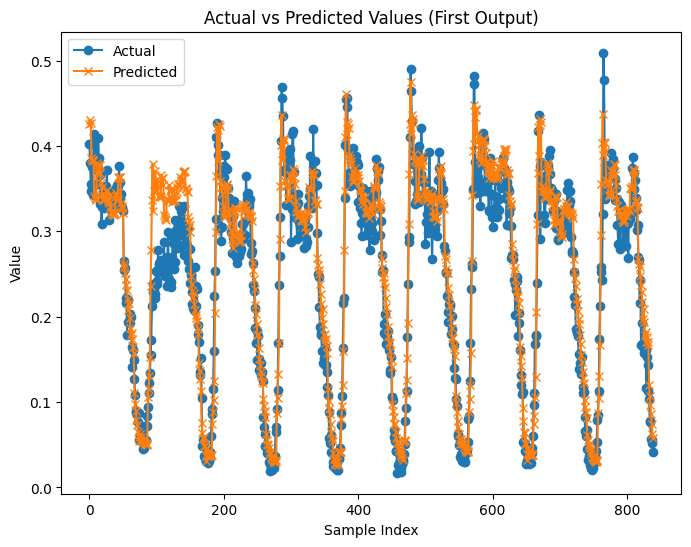

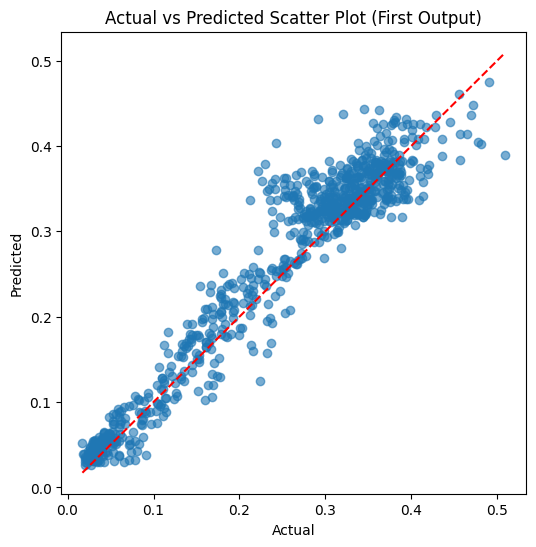

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Convert Y_test to numpy array if it isn't already
Y_test_np = np.array(Y_test)
y_pred = cross_model.predict([X_test, X_test])

# --- Line plot for the first output ---
plt.figure(figsize=(8, 6))
plt.plot(Y_test_np[:, 0], label='Actual', marker='o')
plt.plot(y_pred[:, 0], label='Predicted', marker='x')
plt.title('Actual vs Predicted Values (First Output)')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend()
plt.show()

# --- Scatter plot for the first output ---
plt.figure(figsize=(6, 6))
plt.scatter(Y_test_np[:, 0], y_pred[:, 0], alpha=0.6)
plt.plot([Y_test_np[:,0].min(), Y_test_np[:,0].max()],
         [Y_test_np[:,0].min(), Y_test_np[:,0].max()], 'r--')  # perfect prediction line
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted Scatter Plot (First Output)')
plt.show()


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


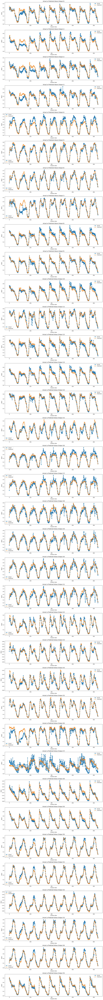

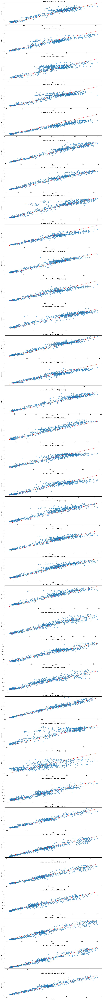

In [17]:
import matplotlib.pyplot as plt
import numpy as np

# --- Predictions from your cross-attention model ---
y_pred = cross_model.predict([X_test, X_test])
Y_test_np = np.array(Y_test)  # ensure it's a numpy array

num_outputs = y_pred.shape[1]

# --- Line plots for all outputs ---
plt.figure(figsize=(15, 4 * num_outputs))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.plot(Y_test_np[:, i], label='Actual', marker='o')
    plt.plot(y_pred[:, i], label='Predicted', marker='x')
    plt.title(f'Actual vs Predicted Values (Output {i})')
    plt.xlabel('Sample Index')
    plt.ylabel('Value')
    plt.legend()
plt.tight_layout()
plt.show()

# --- Scatter plots for all outputs ---
plt.figure(figsize=(15, 4 * num_outputs))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.scatter(Y_test_np[:, i], y_pred[:, i], alpha=0.6)
    plt.plot([Y_test_np[:,i].min(), Y_test_np[:,i].max()],
             [Y_test_np[:,i].min(), Y_test_np[:,i].max()], 'r--')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Actual vs Predicted Scatter Plot (Output {i})')
plt.tight_layout()
plt.show()


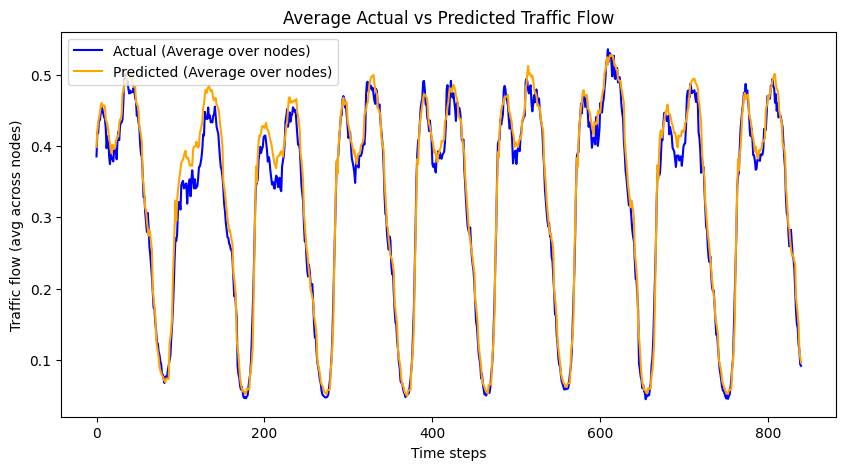

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming Y_test_np and y_pred are numpy arrays of shape (samples, nodes)
# Take mean across nodes (axis=1)
Y_test_avg = np.mean(Y_test_np, axis=1)
y_pred_avg = np.mean(y_pred, axis=1)

# Plotting
plt.figure(figsize=(10, 5))
plt.plot(Y_test_avg, label="Actual (Average over nodes)", color="blue")
plt.plot(y_pred_avg, label="Predicted (Average over nodes)", color="orange")
plt.xlabel("Time steps")
plt.ylabel("Traffic flow (avg across nodes)")
plt.title("Average Actual vs Predicted Traffic Flow")
plt.legend()
plt.show()
